# MNIST GAN Model

In [15]:
### Since this model incorporates data from the MNIST dataset and utilizes several epochs to improve traning of the discriminator and generator of the
### network, it is recommended that you run this program with a dedicated GPU if available as it will take roughly two hours on the CPU alone.
### Therefore, it is recommended to run this program on HiPerGator with a GPU and a minimum of 6 Gb of memory and it will take roughly 20 minutes total.
### Additionally, you can reduce the time of compiling by reducing the number of epochs, however, this will reduce the overall efficiacy of the model.

In [30]:
import torch 
from torch import nn
import math
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

In [17]:
#Manual Seed to replicate the experiment
torch.manual_seed(69)

device = ""
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

# Preparing the Training Data
For this example we will be using the MNIST dataset which contains grayscale 28x28 sized images of handwritten digits from zero to nine. Then using Pytorch, conversions will be made to tensors with a range of 0 to 1. The Transforms.ToTensor() funciton works to convert the data to a PyTorch tensor which is a multidimensional array similar to that of a NumPy array. The 
Normalize function works to change the range from -1 to 1 instead.

Since the original values of the transforms.ToTensor are usually 0 to 1, the normalization to -1 and 1 is necessary as since most of the image backgrounds are black and are equal to zero, this is hinder the training of the models. Therefore, normalizing the tensor values is necessary to reduce the instance of zero and to improve the numer of elements that are different in value.

In [18]:
trsfrm = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,),(0.5,))]
)

In [19]:
#Using the native data call in torchvision of the MNIST dataset
#setting download to true has the MNIST dataset downloaded the first instance the code is run
#Then the data will be stored in the current working directory
train_d = torchvision.datasets.MNIST(
    root=".", train=True, download=True, transform=trsfrm
)

In [20]:
#The batch_s variable denotes the number of samples that will be used from the MNIST dataset to train the Discriminator
#and the total number of values for training in general
#Changing this value will require a change in the parameter setup for the discriminator and generator
#The tain_ld varaible calls the pytorch data loader which will shuffle data from the called dataset and return the set number of samples
batch_s = 32
train_ld = torch.utils.data.DataLoader(
    train_d, batch_size = batch_s, shuffle = True
)

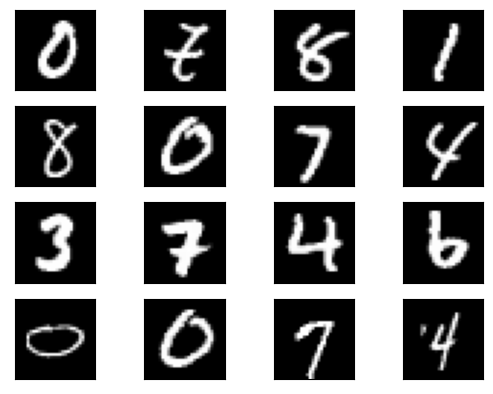

In [21]:
#An example of the numbers from the MNIST dataset
samples, mnist_labels = next(iter(train_ld))
for i in range(16):
    axis = plt.subplot(4, 4, i+1)
    plt.imshow(samples[i].reshape(28,28), cmap="gray")
    plt.xticks([])
    plt.yticks([])

# Implementing the Discriminator and Generator
The Discriminator for this example will be a multilayer preceptrons (MLP) neural network that will provide the probability that the image it receives belongs to the real training data

In [22]:
#PyToch represents the neural network models as classes that inherit from the nn.Module
#Therefore, we define classes for the Discriminator and Generator of the GAN network
#Vectorization of the discriminator occurs with the .forword() call
#Original input shape is 32x1x28x28 as 32 is the batch size and the input pictures are 28x28
#After converting the input tensor to the size wanted (28x28) we get 32x784
class Discrim(nn.Module):
    def __init__(self): #This is used to build the model
        super().__init__() #This is used to run the model from the nn.Module of PyTorch
        self.model = nn.Sequential( #Defines the MLP network used for this example (CNN or other networks can be used)
        nn.Linear(784,1024),
        nn.ReLU(), #Activates hidden layer
        nn.Dropout(0.3), #Used to reduce overfitting of the data
        nn.Linear(1024,512),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(512, 256),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(256,1),
        nn.Sigmoid(), #Sigmoidal activiation to indicate probability
        )
        
    def forward(self,x): #This will describe how the output is calculated. X is the two dimensional tensor that is the model
        x = x.view(x.size(0), 784)
        output = self.model(x)
        return output

In [23]:
discrim = Discrim().to(device=device)

## Generator Creation

In [24]:
#The MNIST data is more complex than just numbers in an array.
#Therefore, an increase in the dimension of the latent space is necessary to provide improved training
#For this example, the generator will be fed a 100 dimensional input
class Gen(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100,256),
            nn.ReLU(),
            nn.Linear(256,512),
            nn.ReLU(),
            nn.Linear(512,1024),
            nn.ReLU(),
            nn.Linear(1024,784),
            nn.Tanh(), #Activates the ouput layer since output coefficients is a tensor from -1 to 1
        )
    def forward(self,x):
        output = self.model(x)
        output = output.view(x.size(0),1,28,28)
        return output
    
gen = Gen().to(device=device)

# Training the Model

In [27]:
#Setting the training parameters:
#The learning rate is what is used to adapt the network weights
#The number of epochs indicates the number of repetitions of training using the entire training set
#The loss function uses the binary cross-entropy function and considers a binary classification task suitable for training the generator
learningr = 0.0001
epochs_num = 100
loss_func = nn.BCELoss() 

#Since Pytorch uses different weight update rules for model training in torch.optim, using the Adam algorithm will be done to train the discriminator and generator.

optimize_discrim = torch.optim.Adam(discrim.parameters(), lr=learningr)
optimize_gen = torch.optim.Adam(gen.parameters(), lr = learningr)

Epoch: 1 Loss D.: 0.3401373624801636
Epoch: 1 Loss G.: 1.425443172454834


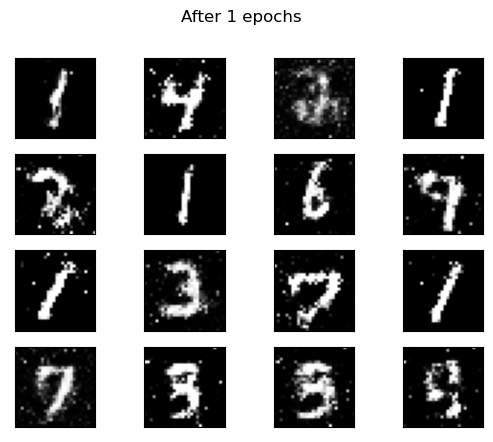

Epoch: 2 Loss D.: 0.4651854932308197
Epoch: 2 Loss G.: 1.4875577688217163


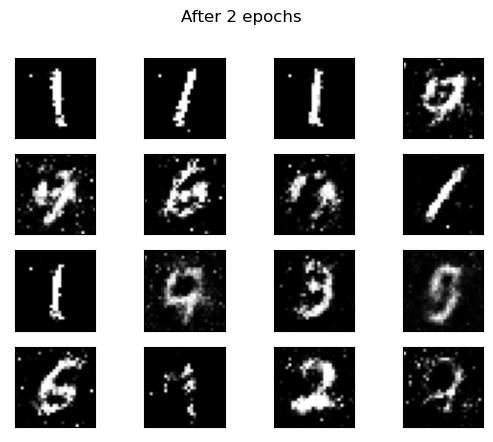

Epoch: 3 Loss D.: 0.5507835149765015
Epoch: 3 Loss G.: 1.2683336734771729


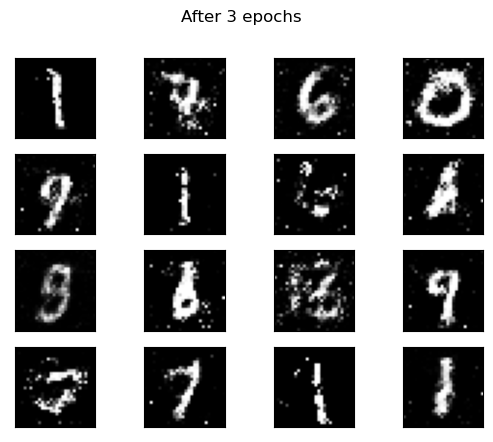

Epoch: 4 Loss D.: 0.5001588463783264
Epoch: 4 Loss G.: 1.5026819705963135


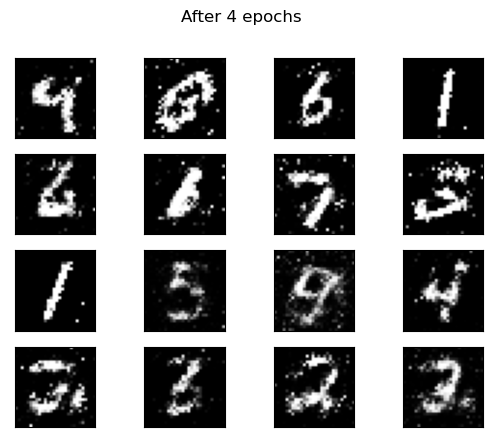

Epoch: 5 Loss D.: 0.42556414008140564
Epoch: 5 Loss G.: 1.220272421836853


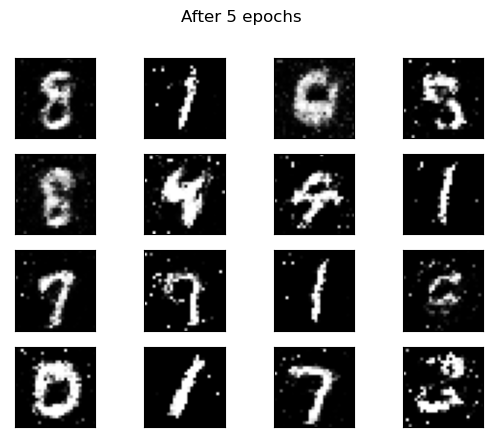

Epoch: 6 Loss D.: 0.6239912509918213
Epoch: 6 Loss G.: 1.2985048294067383


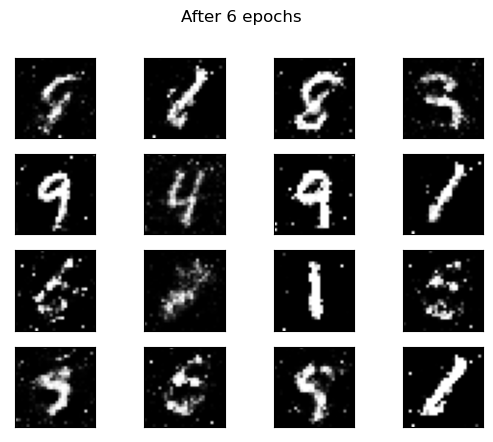

Epoch: 7 Loss D.: 0.44059255719184875
Epoch: 7 Loss G.: 1.5436317920684814


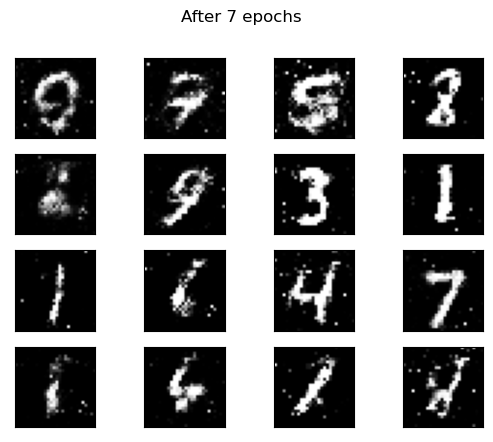

Epoch: 8 Loss D.: 0.6106886863708496
Epoch: 8 Loss G.: 1.3161746263504028


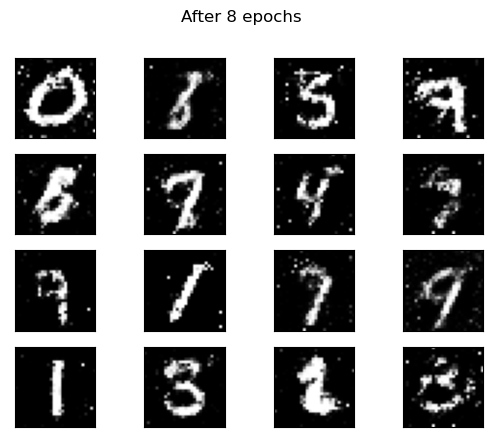

Epoch: 9 Loss D.: 0.5885823965072632
Epoch: 9 Loss G.: 1.1418319940567017


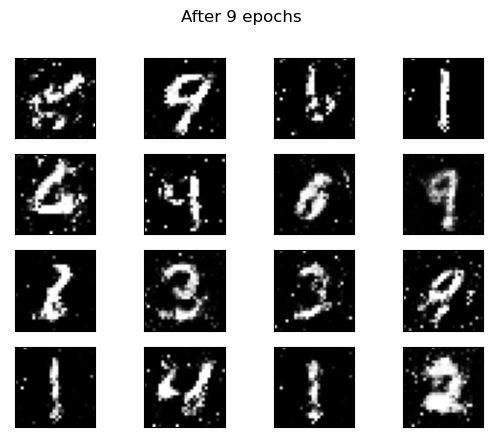

Epoch: 10 Loss D.: 0.5846397280693054
Epoch: 10 Loss G.: 1.1301496028900146


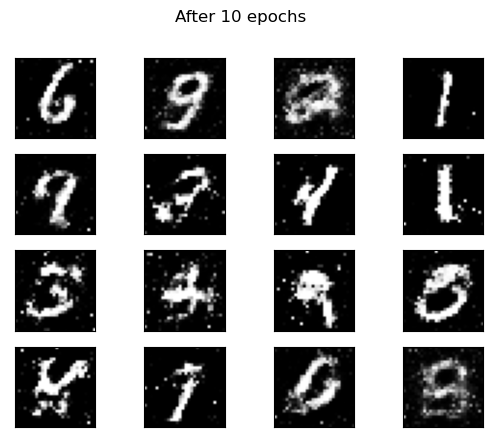

Epoch: 11 Loss D.: 0.5076959133148193
Epoch: 11 Loss G.: 1.3786544799804688


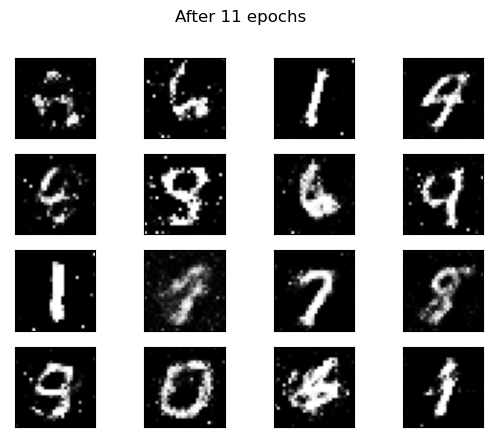

Epoch: 12 Loss D.: 0.5408669710159302
Epoch: 12 Loss G.: 1.353683352470398


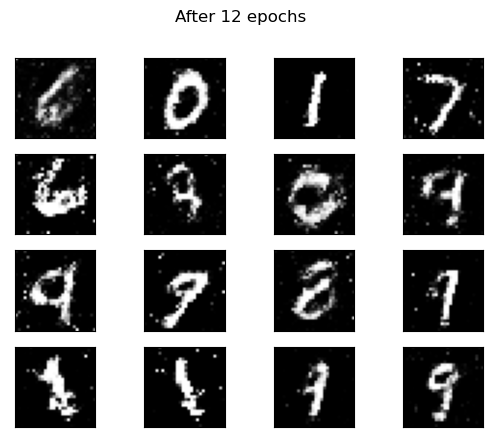

Epoch: 13 Loss D.: 0.48391473293304443
Epoch: 13 Loss G.: 1.0541292428970337


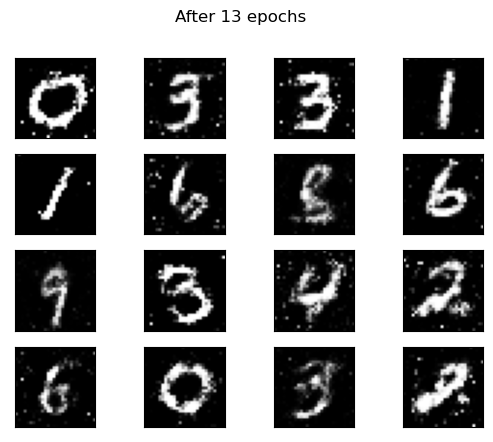

Epoch: 14 Loss D.: 0.649520754814148
Epoch: 14 Loss G.: 1.1108794212341309


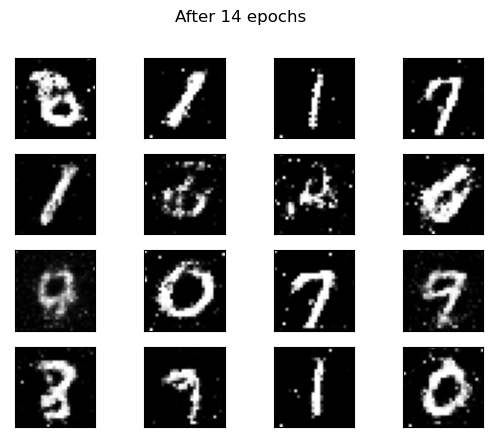

Epoch: 15 Loss D.: 0.518326461315155
Epoch: 15 Loss G.: 1.0823395252227783


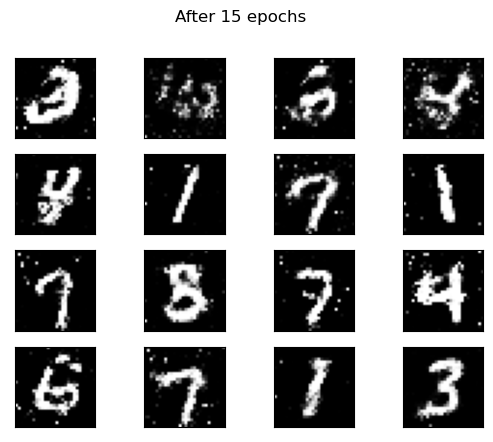

Epoch: 16 Loss D.: 0.5390535593032837
Epoch: 16 Loss G.: 1.4867634773254395


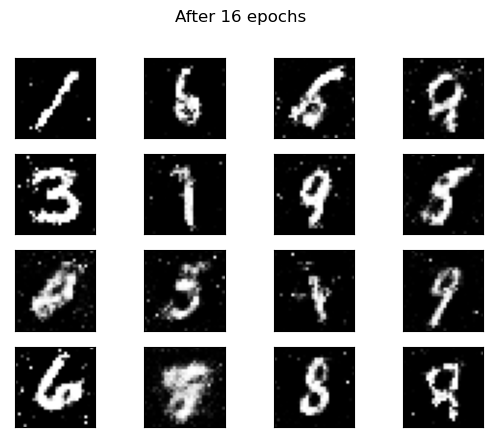

Epoch: 17 Loss D.: 0.5776343941688538
Epoch: 17 Loss G.: 1.1996614933013916


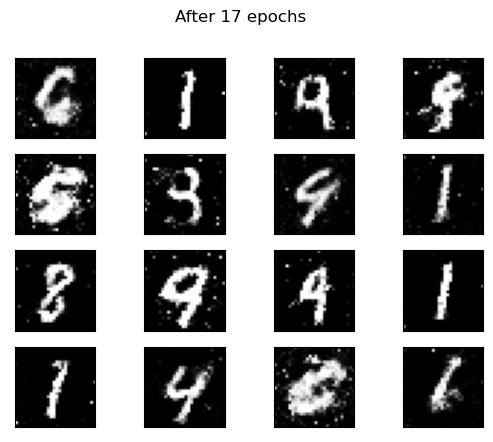

Epoch: 18 Loss D.: 0.516211748123169
Epoch: 18 Loss G.: 1.0652421712875366


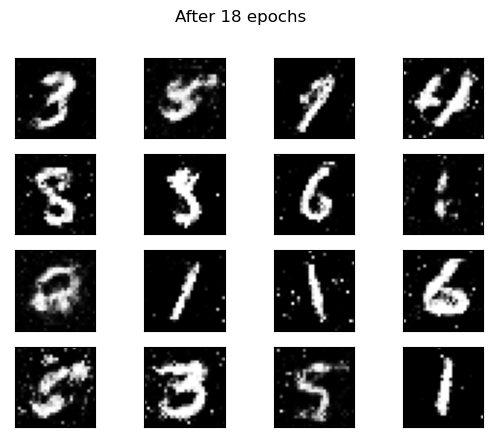

Epoch: 19 Loss D.: 0.5298328399658203
Epoch: 19 Loss G.: 1.0257916450500488


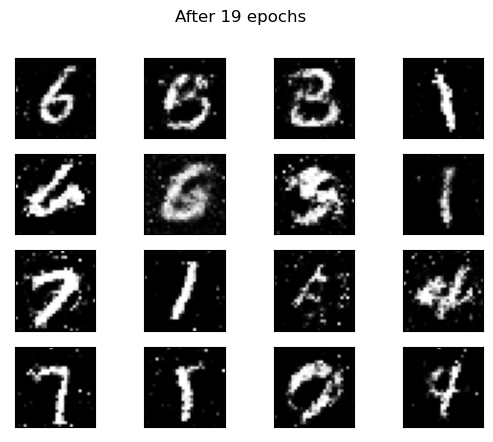

Epoch: 20 Loss D.: 0.5544208288192749
Epoch: 20 Loss G.: 1.0788695812225342


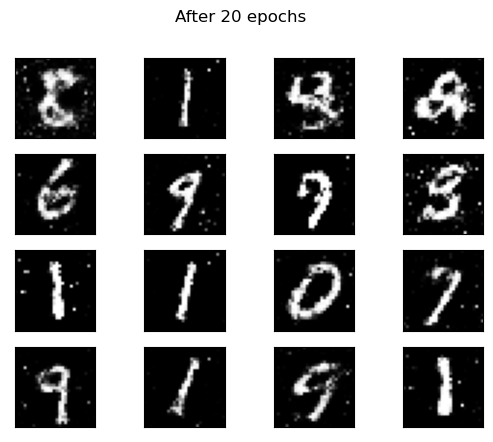

Epoch: 21 Loss D.: 0.5410043001174927
Epoch: 21 Loss G.: 1.2958639860153198


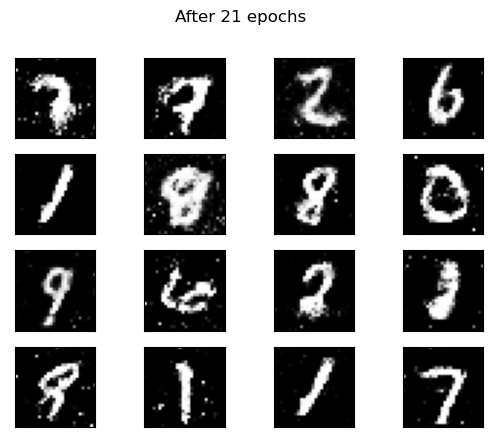

Epoch: 22 Loss D.: 0.5711131691932678
Epoch: 22 Loss G.: 1.0291187763214111


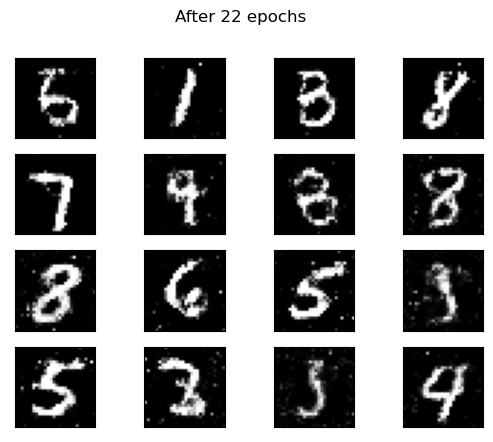

Epoch: 23 Loss D.: 0.6431978940963745
Epoch: 23 Loss G.: 1.2341171503067017


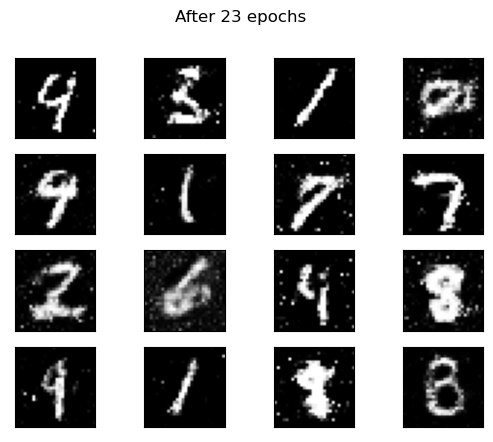

Epoch: 24 Loss D.: 0.5014607906341553
Epoch: 24 Loss G.: 1.1373504400253296


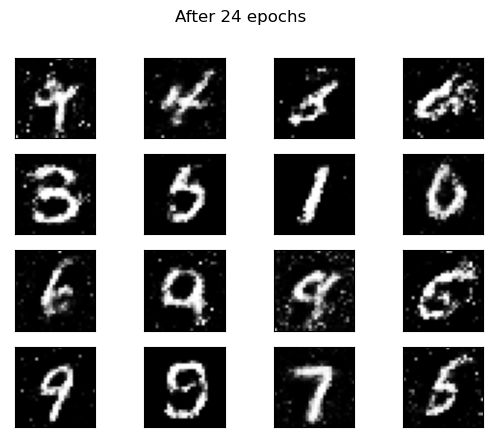

Epoch: 25 Loss D.: 0.5777148008346558
Epoch: 25 Loss G.: 1.1874070167541504


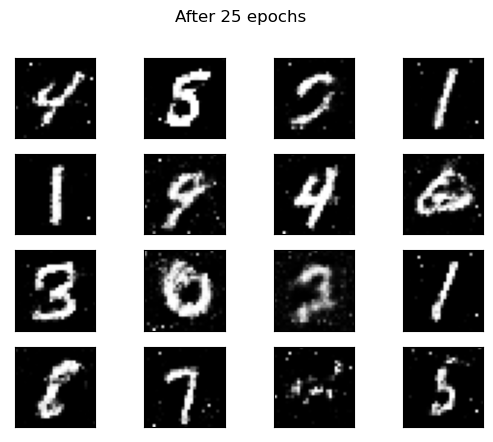

Epoch: 26 Loss D.: 0.5879895687103271
Epoch: 26 Loss G.: 1.1482667922973633


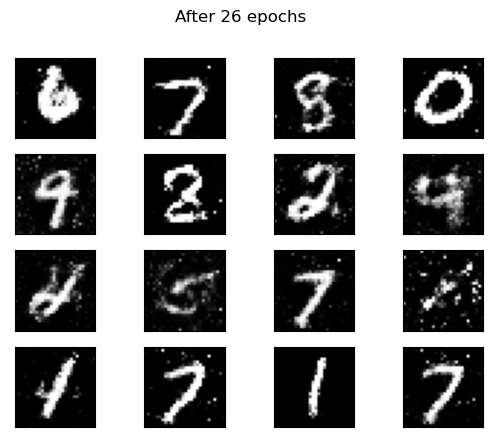

Epoch: 27 Loss D.: 0.5627248287200928
Epoch: 27 Loss G.: 1.1539651155471802


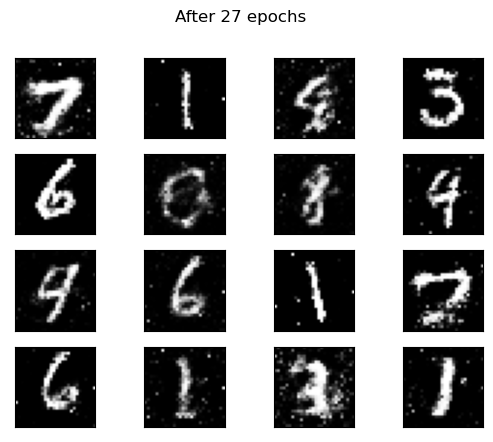

Epoch: 28 Loss D.: 0.5567595958709717
Epoch: 28 Loss G.: 1.1929868459701538


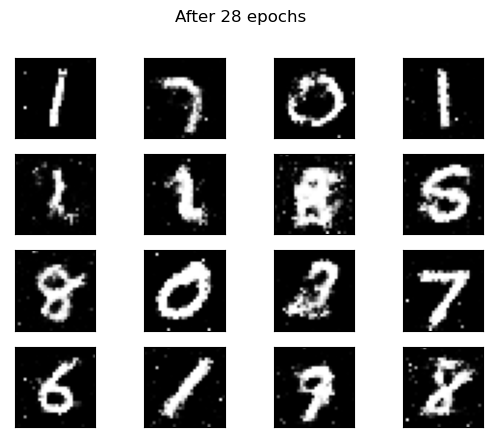

Epoch: 29 Loss D.: 0.5456045866012573
Epoch: 29 Loss G.: 0.902438223361969


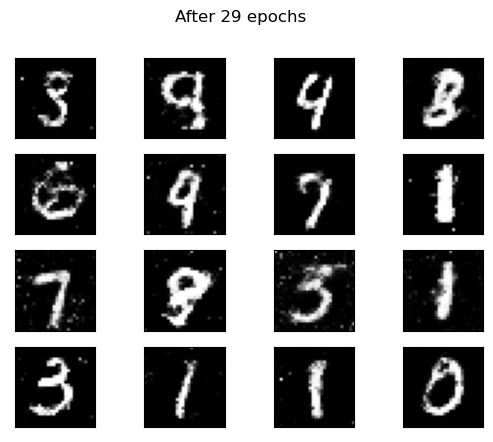

Epoch: 30 Loss D.: 0.5732817649841309
Epoch: 30 Loss G.: 1.2069190740585327


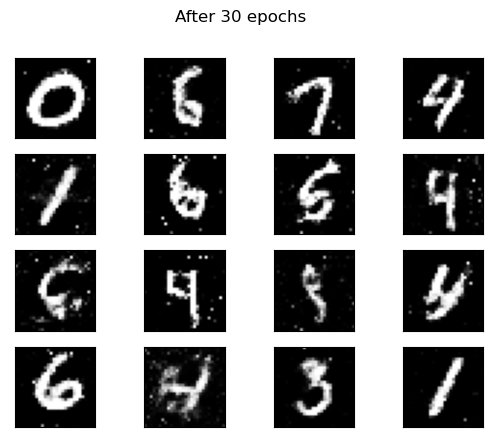

Epoch: 31 Loss D.: 0.5428162217140198
Epoch: 31 Loss G.: 0.9777073860168457


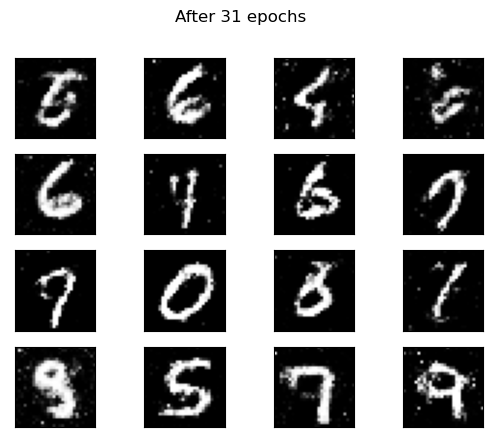

Epoch: 32 Loss D.: 0.5985139608383179
Epoch: 32 Loss G.: 1.1206028461456299


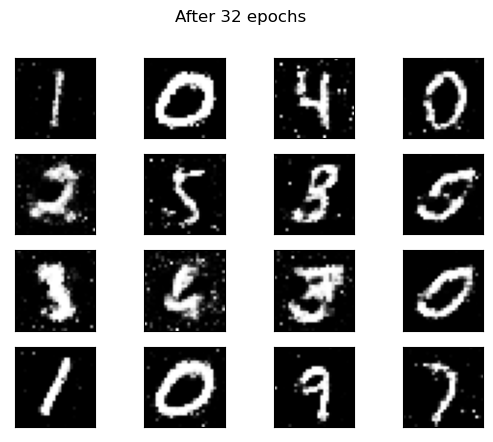

Epoch: 33 Loss D.: 0.5490024089813232
Epoch: 33 Loss G.: 1.0278117656707764


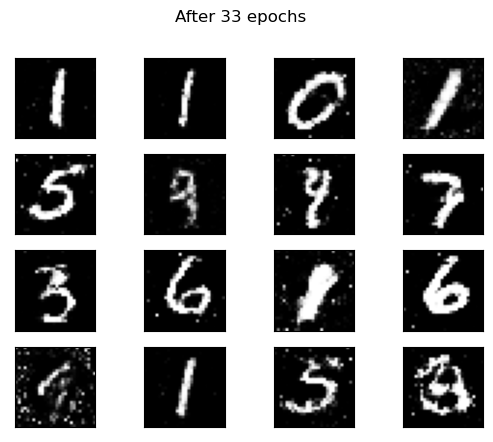

Epoch: 34 Loss D.: 0.6097661852836609
Epoch: 34 Loss G.: 1.2044358253479004


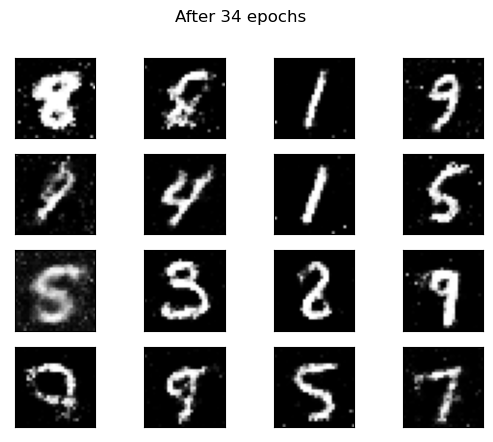

Epoch: 35 Loss D.: 0.5164383053779602
Epoch: 35 Loss G.: 1.1018801927566528


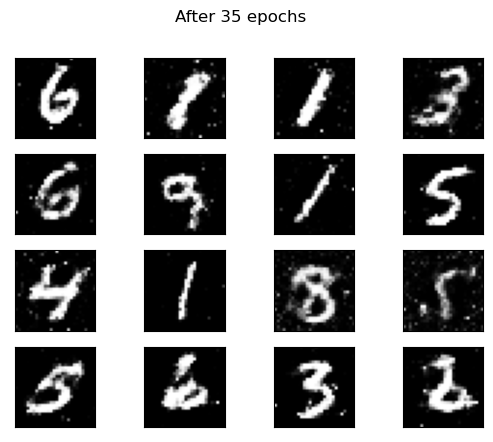

Epoch: 36 Loss D.: 0.5543656349182129
Epoch: 36 Loss G.: 1.2516390085220337


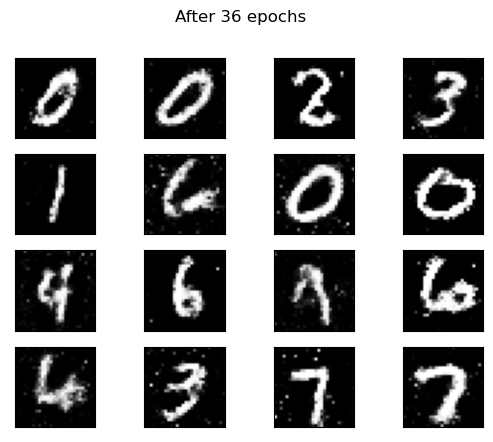

Epoch: 37 Loss D.: 0.6286165118217468
Epoch: 37 Loss G.: 0.9473456740379333


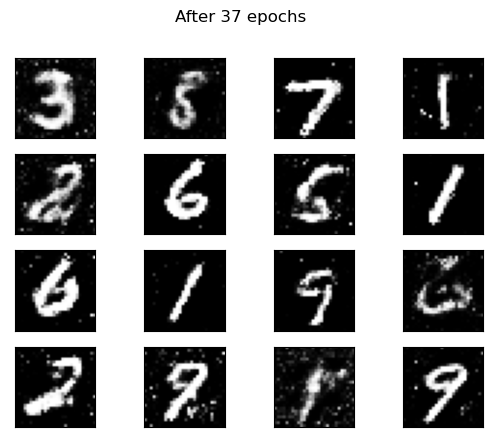

Epoch: 38 Loss D.: 0.5701474547386169
Epoch: 38 Loss G.: 1.04483163356781


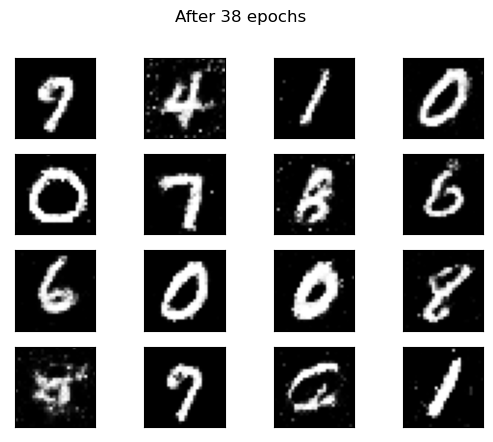

Epoch: 39 Loss D.: 0.5215332508087158
Epoch: 39 Loss G.: 1.1071754693984985


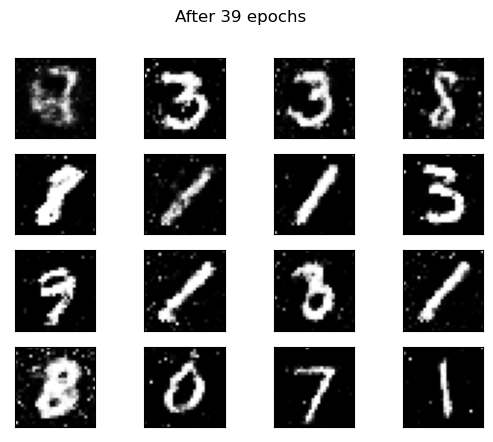

Epoch: 40 Loss D.: 0.48365265130996704
Epoch: 40 Loss G.: 1.0522561073303223


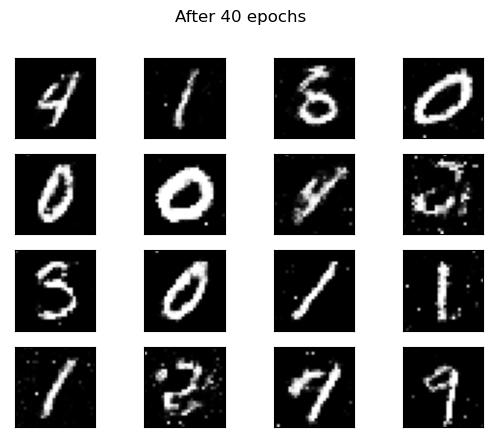

Epoch: 41 Loss D.: 0.5630138516426086
Epoch: 41 Loss G.: 1.1797802448272705


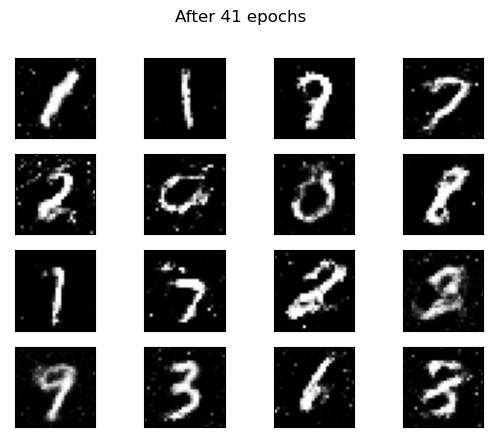

Epoch: 42 Loss D.: 0.5985535383224487
Epoch: 42 Loss G.: 0.8736094236373901


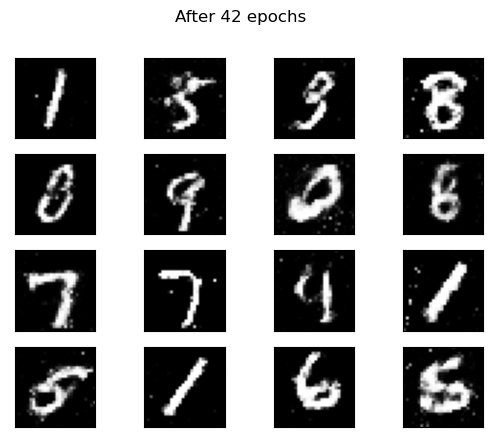

Epoch: 43 Loss D.: 0.5263587236404419
Epoch: 43 Loss G.: 1.0776976346969604


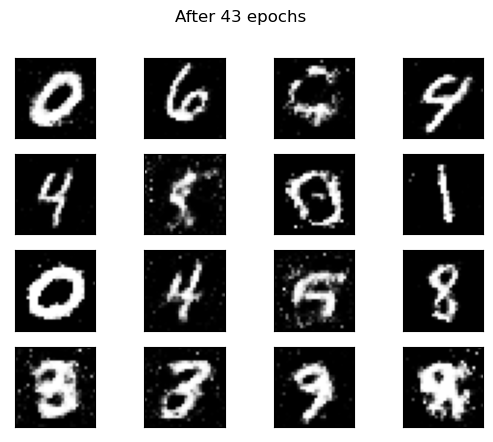

Epoch: 44 Loss D.: 0.5839694738388062
Epoch: 44 Loss G.: 1.0814425945281982


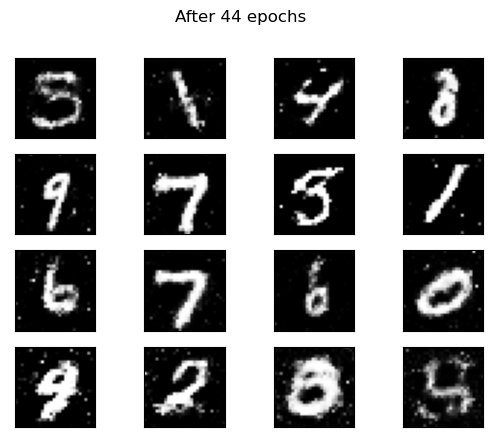

Epoch: 45 Loss D.: 0.4882511496543884
Epoch: 45 Loss G.: 0.9731512069702148


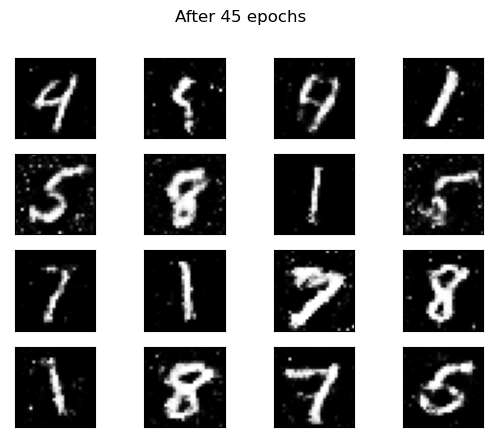

Epoch: 46 Loss D.: 0.4653797447681427
Epoch: 46 Loss G.: 1.0515187978744507


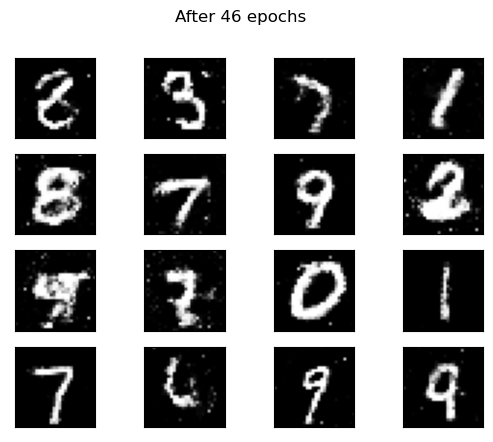

Epoch: 47 Loss D.: 0.548753023147583
Epoch: 47 Loss G.: 1.013148307800293


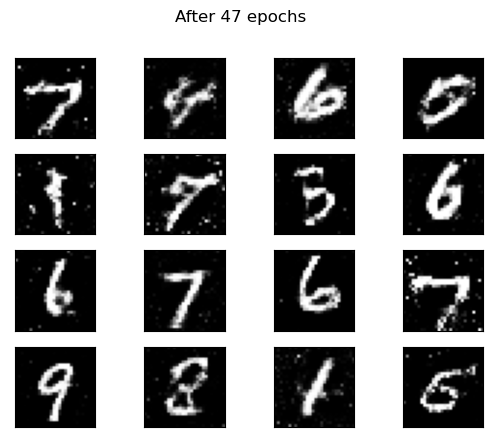

Epoch: 48 Loss D.: 0.6208623647689819
Epoch: 48 Loss G.: 0.848687469959259


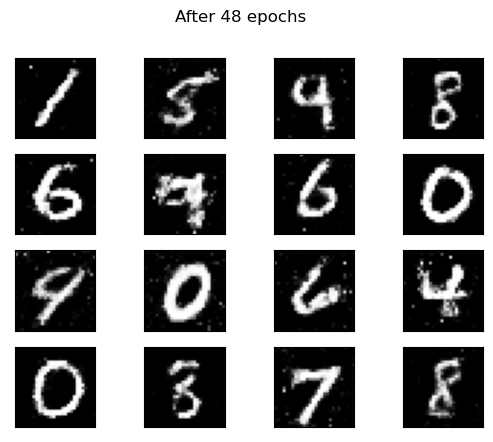

Epoch: 49 Loss D.: 0.5174769163131714
Epoch: 49 Loss G.: 1.0496920347213745


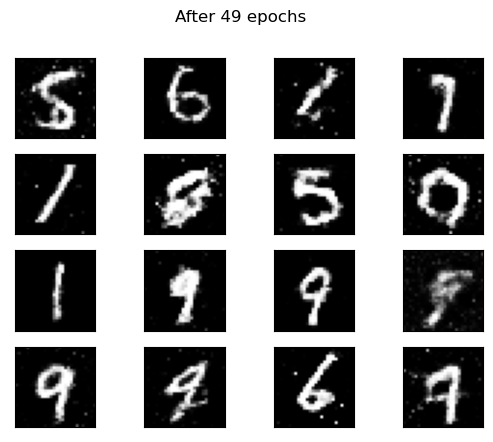

Epoch: 50 Loss D.: 0.6095831394195557
Epoch: 50 Loss G.: 1.047425627708435


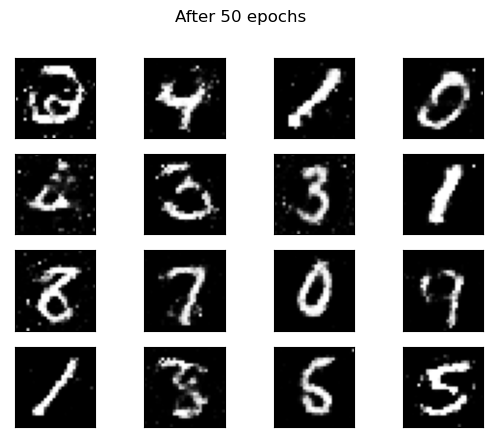

Epoch: 51 Loss D.: 0.6338671445846558
Epoch: 51 Loss G.: 0.963942289352417


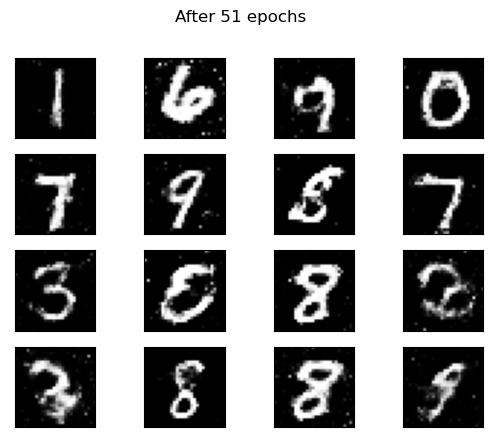

Epoch: 52 Loss D.: 0.6479294300079346
Epoch: 52 Loss G.: 1.089857816696167


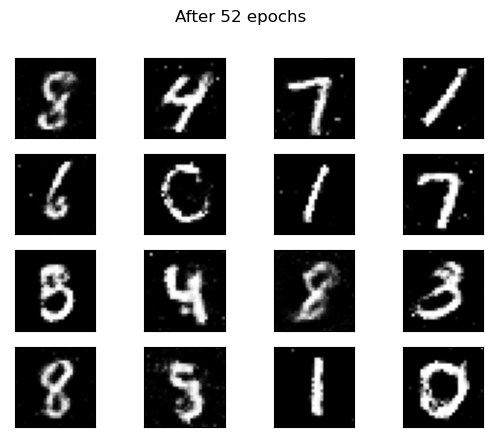

Epoch: 53 Loss D.: 0.5287764668464661
Epoch: 53 Loss G.: 0.9868062734603882


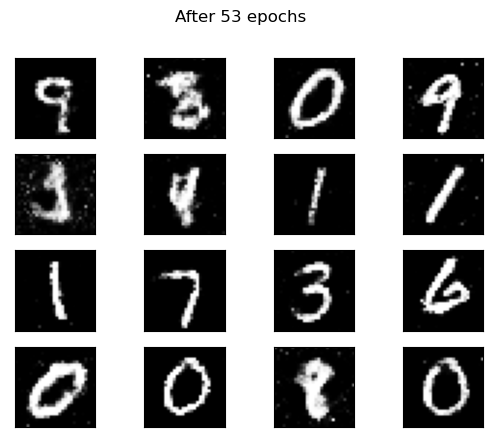

Epoch: 54 Loss D.: 0.5703609585762024
Epoch: 54 Loss G.: 0.9611197113990784


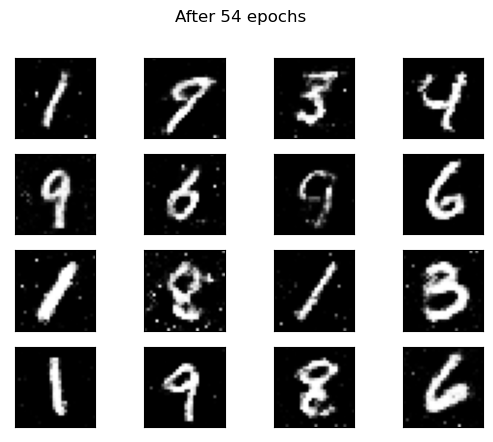

Epoch: 55 Loss D.: 0.5028291344642639
Epoch: 55 Loss G.: 1.0940802097320557


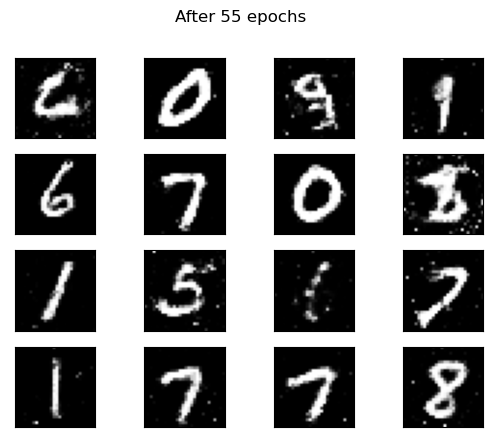

Epoch: 56 Loss D.: 0.4775223731994629
Epoch: 56 Loss G.: 1.0181814432144165


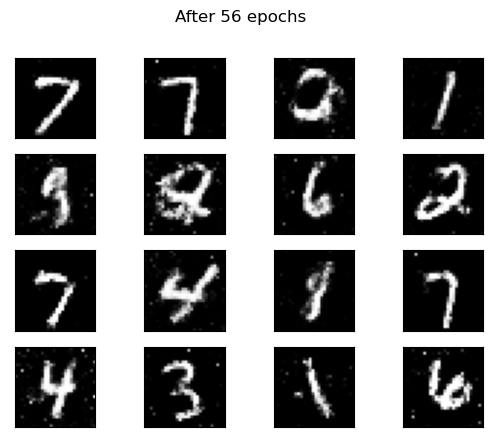

Epoch: 57 Loss D.: 0.5913841724395752
Epoch: 57 Loss G.: 1.0729870796203613


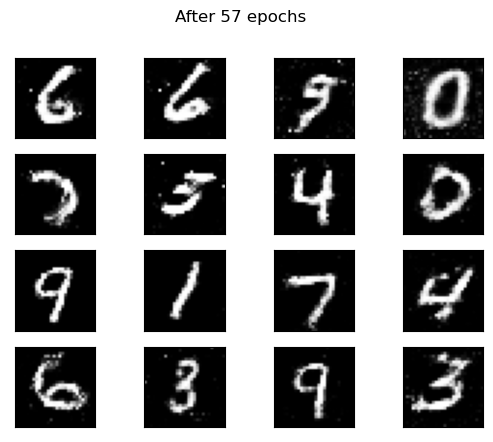

Epoch: 58 Loss D.: 0.6124782562255859
Epoch: 58 Loss G.: 1.1231611967086792


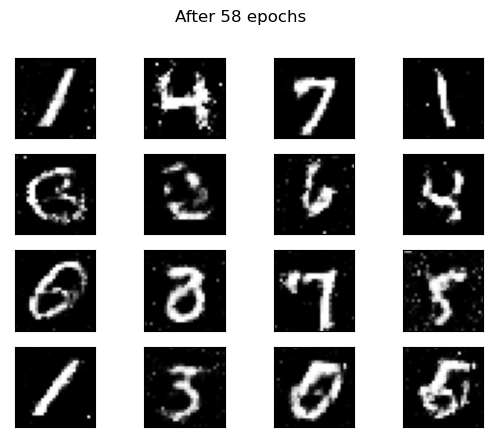

Epoch: 59 Loss D.: 0.628999650478363
Epoch: 59 Loss G.: 1.0333112478256226


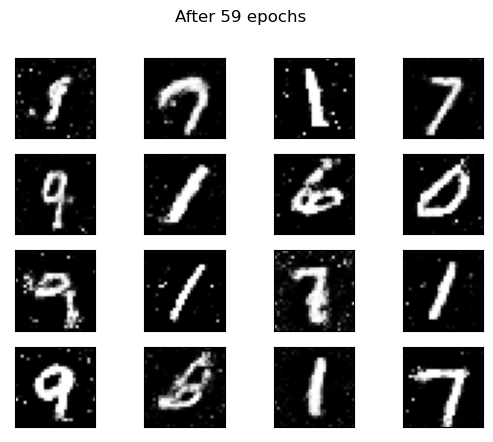

Epoch: 60 Loss D.: 0.6373716592788696
Epoch: 60 Loss G.: 1.0356318950653076


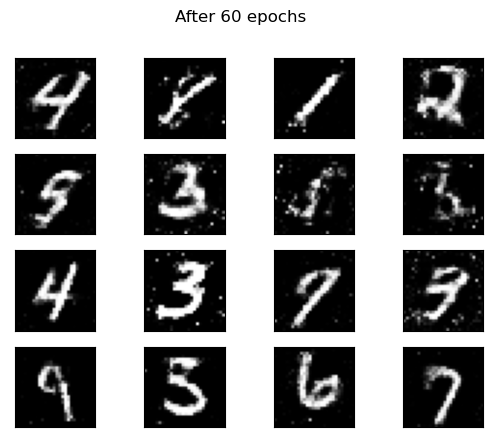

Epoch: 61 Loss D.: 0.5410832166671753
Epoch: 61 Loss G.: 1.0337718725204468


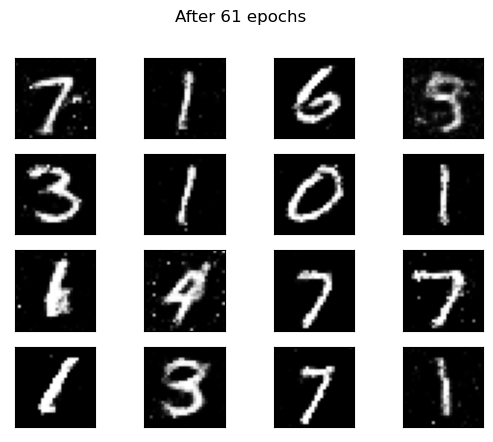

Epoch: 62 Loss D.: 0.4942661225795746
Epoch: 62 Loss G.: 1.0085339546203613


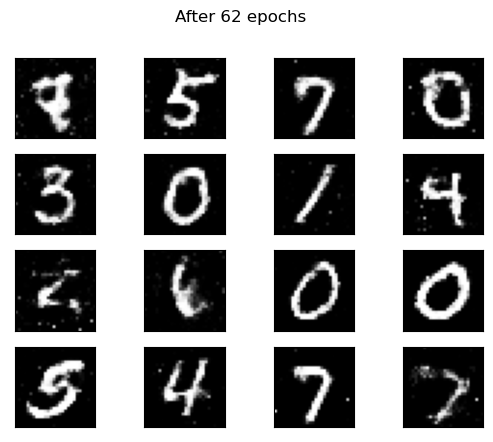

Epoch: 63 Loss D.: 0.5845382213592529
Epoch: 63 Loss G.: 1.0299102067947388


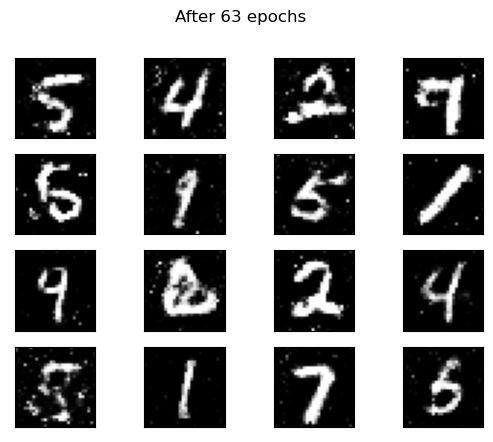

Epoch: 64 Loss D.: 0.5752897262573242
Epoch: 64 Loss G.: 1.1921916007995605


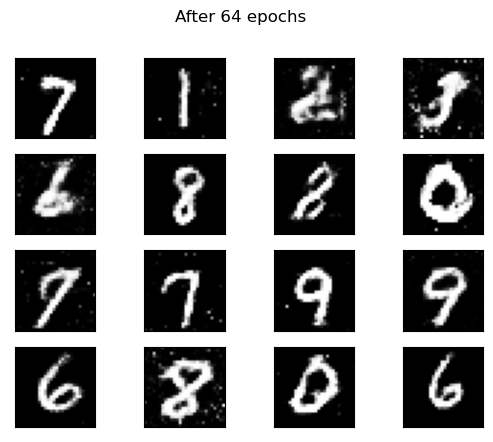

Epoch: 65 Loss D.: 0.5600855946540833
Epoch: 65 Loss G.: 1.2405545711517334


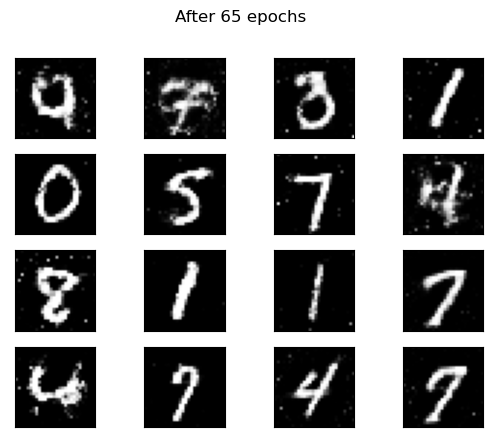

Epoch: 66 Loss D.: 0.5679217576980591
Epoch: 66 Loss G.: 0.9158281683921814


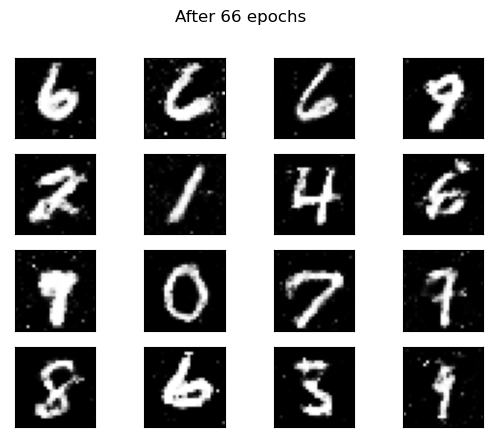

Epoch: 67 Loss D.: 0.4943138062953949
Epoch: 67 Loss G.: 1.0193939208984375


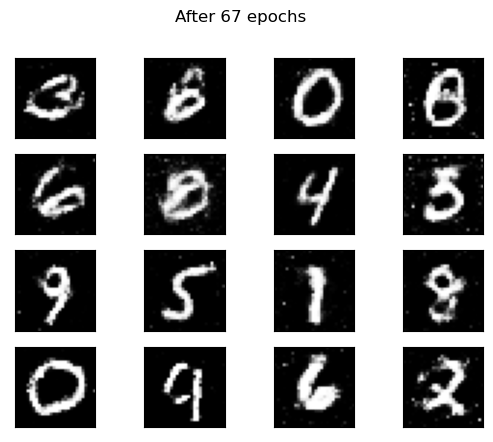

Epoch: 68 Loss D.: 0.480208158493042
Epoch: 68 Loss G.: 0.8541144132614136


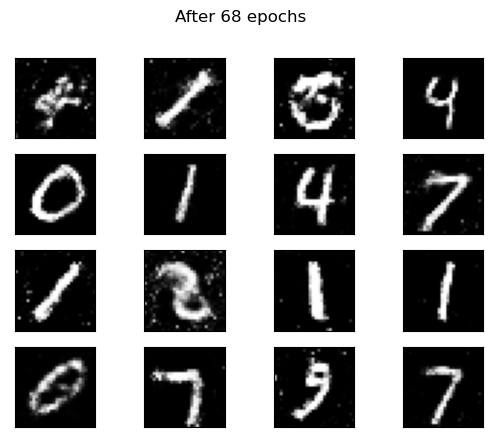

Epoch: 69 Loss D.: 0.557906448841095
Epoch: 69 Loss G.: 1.091748833656311


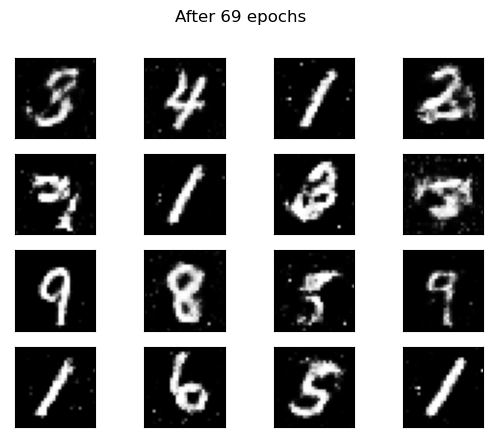

Epoch: 70 Loss D.: 0.5504697561264038
Epoch: 70 Loss G.: 1.1642857789993286


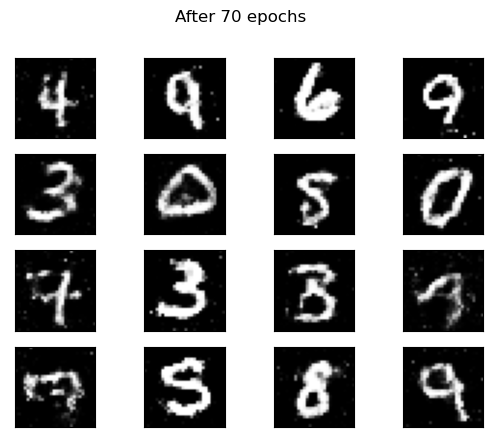

Epoch: 71 Loss D.: 0.5779470205307007
Epoch: 71 Loss G.: 1.0057317018508911


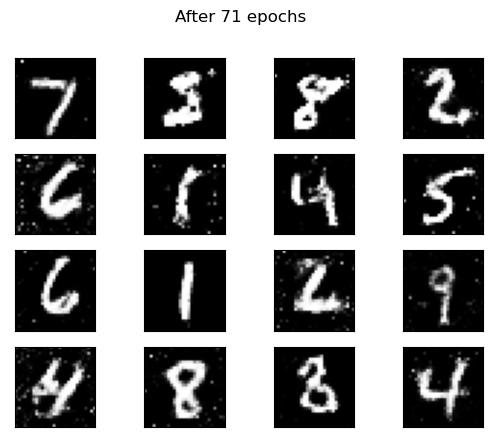

Epoch: 72 Loss D.: 0.5499235391616821
Epoch: 72 Loss G.: 1.1708934307098389


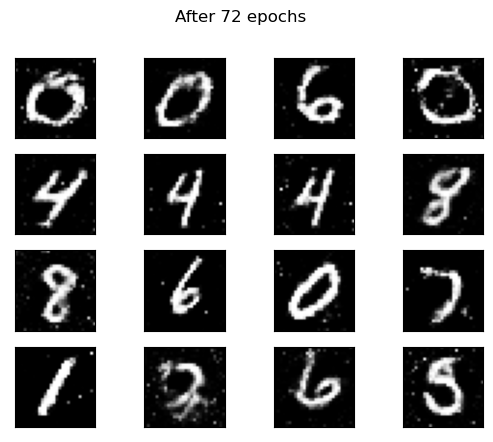

Epoch: 73 Loss D.: 0.6204220056533813
Epoch: 73 Loss G.: 0.9624645709991455


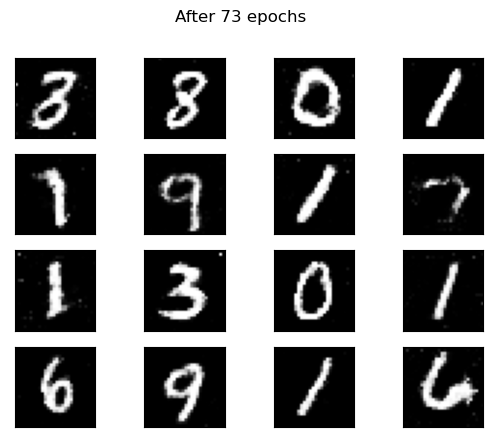

Epoch: 74 Loss D.: 0.5407928228378296
Epoch: 74 Loss G.: 1.234787940979004


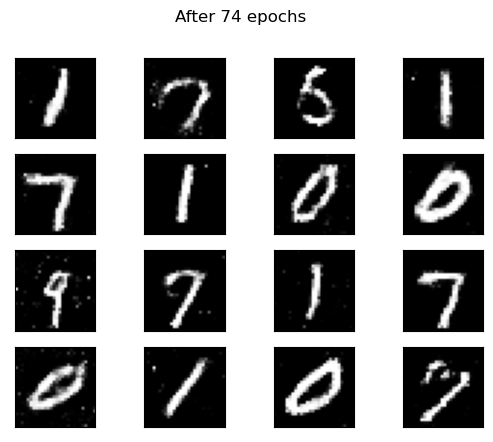

Epoch: 75 Loss D.: 0.5036708116531372
Epoch: 75 Loss G.: 0.9556586742401123


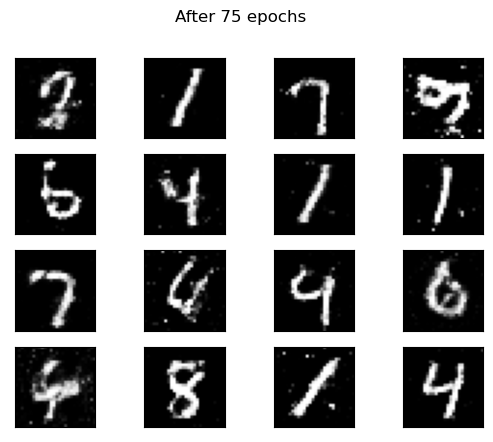

Epoch: 76 Loss D.: 0.5773071050643921
Epoch: 76 Loss G.: 1.1553802490234375


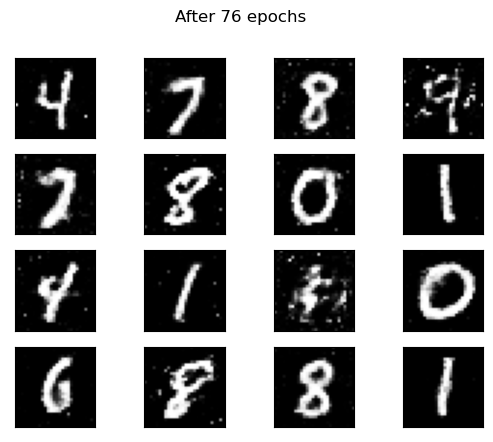

Epoch: 77 Loss D.: 0.5651857852935791
Epoch: 77 Loss G.: 0.86347496509552


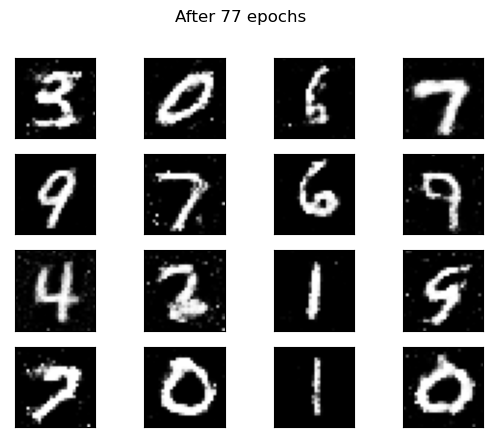

Epoch: 78 Loss D.: 0.5434706211090088
Epoch: 78 Loss G.: 1.095484733581543


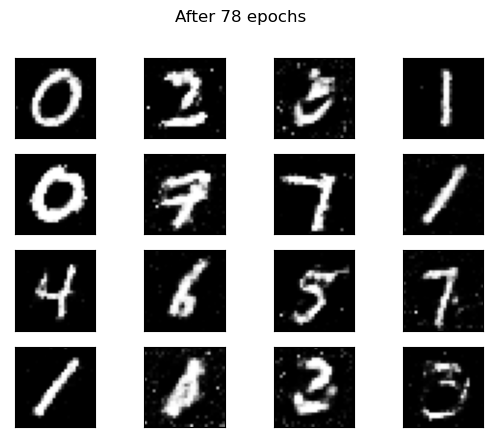

Epoch: 79 Loss D.: 0.5894801616668701
Epoch: 79 Loss G.: 1.2227869033813477


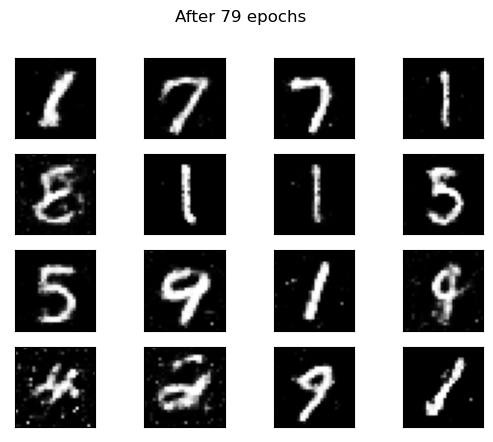

Epoch: 80 Loss D.: 0.543656587600708
Epoch: 80 Loss G.: 1.2555432319641113


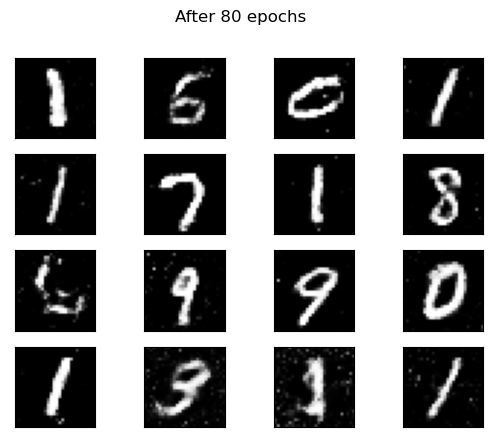

Epoch: 81 Loss D.: 0.5634178519248962
Epoch: 81 Loss G.: 1.0685429573059082


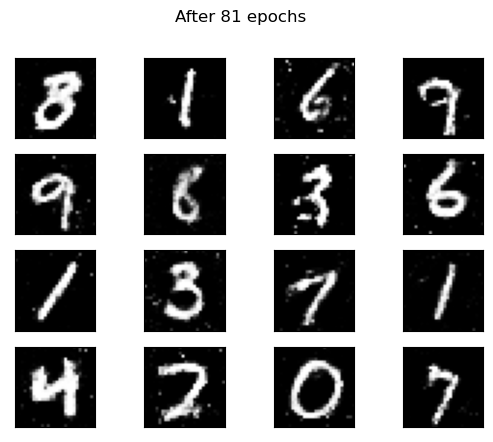

Epoch: 82 Loss D.: 0.4783470928668976
Epoch: 82 Loss G.: 1.1055315732955933


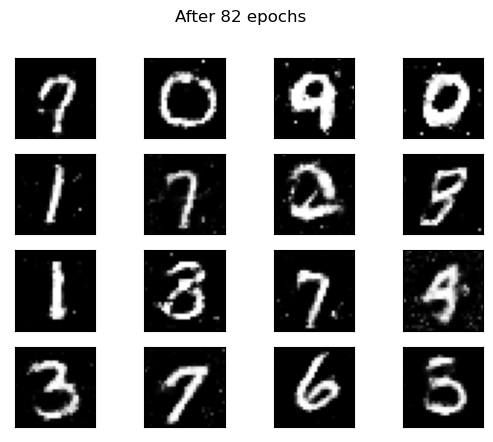

Epoch: 83 Loss D.: 0.6432753801345825
Epoch: 83 Loss G.: 1.2539310455322266


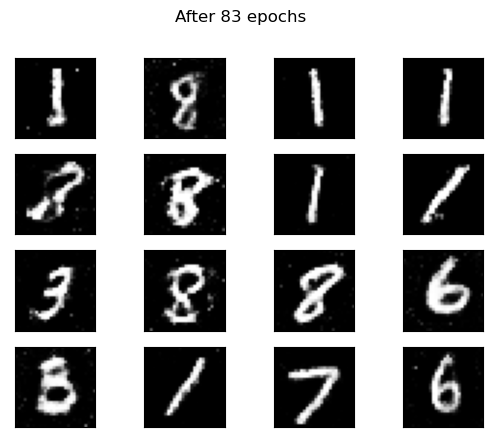

Epoch: 84 Loss D.: 0.48563432693481445
Epoch: 84 Loss G.: 1.2802543640136719


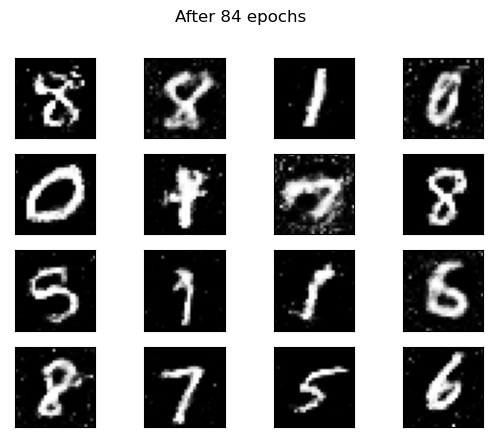

Epoch: 85 Loss D.: 0.5632921457290649
Epoch: 85 Loss G.: 0.9445958137512207


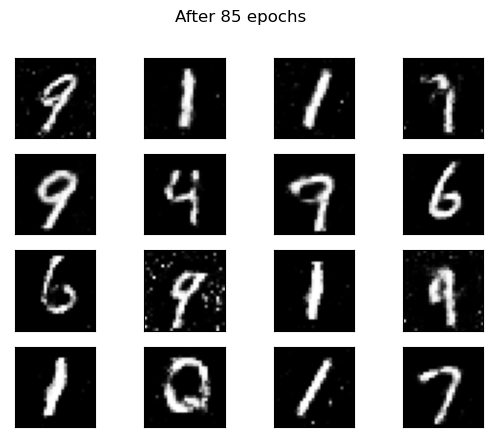

Epoch: 86 Loss D.: 0.6683186292648315
Epoch: 86 Loss G.: 1.1464240550994873


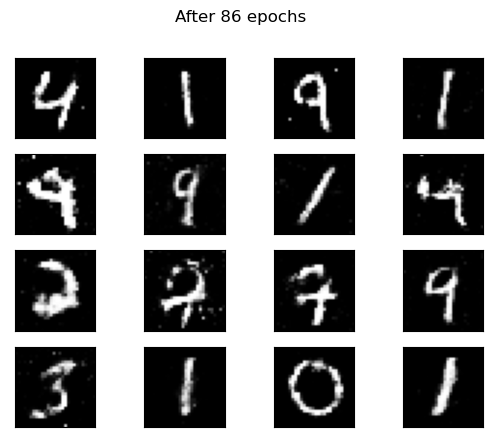

Epoch: 87 Loss D.: 0.5818698406219482
Epoch: 87 Loss G.: 1.0628576278686523


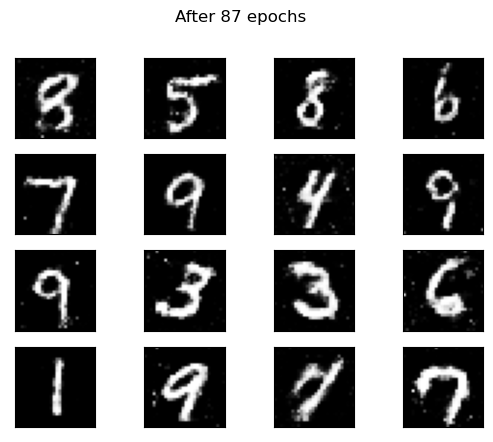

Epoch: 88 Loss D.: 0.6078225374221802
Epoch: 88 Loss G.: 1.0715612173080444


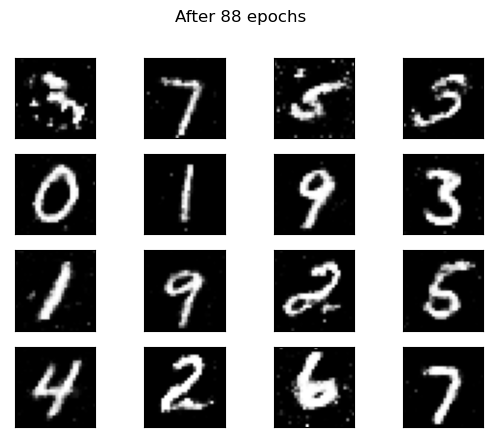

Epoch: 89 Loss D.: 0.5254980325698853
Epoch: 89 Loss G.: 1.1262295246124268


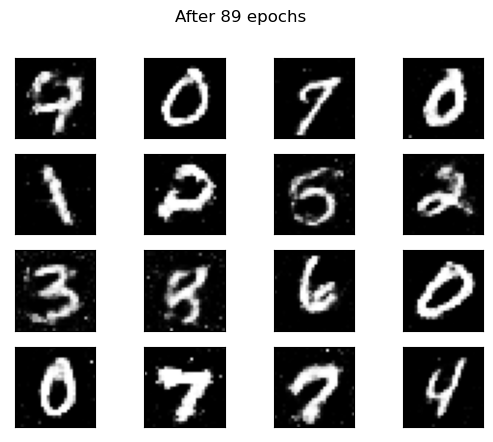

Epoch: 90 Loss D.: 0.593984842300415
Epoch: 90 Loss G.: 1.2666294574737549


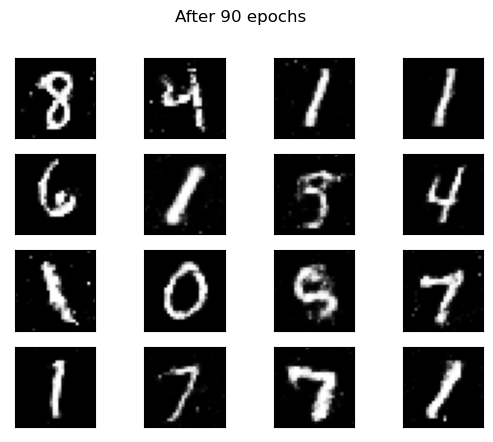

Epoch: 91 Loss D.: 0.5445906519889832
Epoch: 91 Loss G.: 1.109694480895996


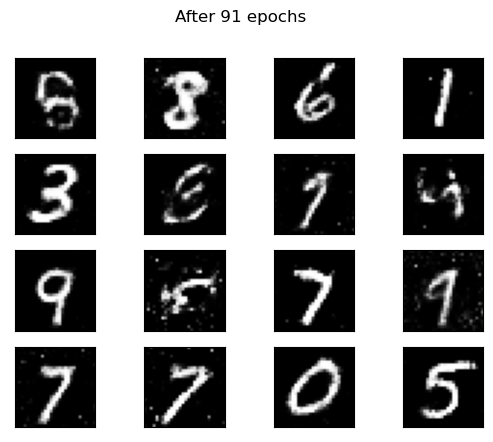

Epoch: 92 Loss D.: 0.594380259513855
Epoch: 92 Loss G.: 1.025353193283081


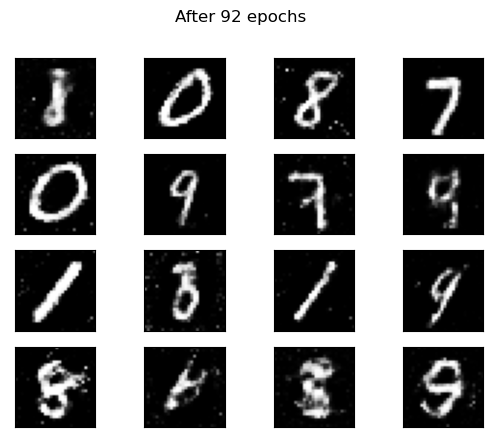

Epoch: 93 Loss D.: 0.513982892036438
Epoch: 93 Loss G.: 1.4469645023345947


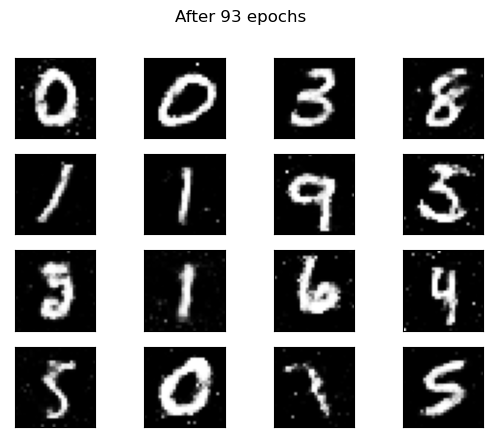

Epoch: 94 Loss D.: 0.6531360745429993
Epoch: 94 Loss G.: 1.0494425296783447


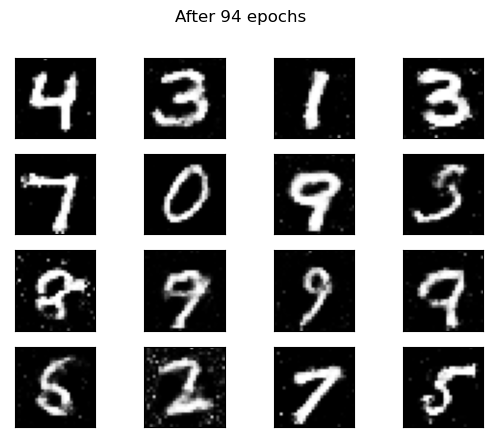

Epoch: 95 Loss D.: 0.5260833501815796
Epoch: 95 Loss G.: 1.0119988918304443


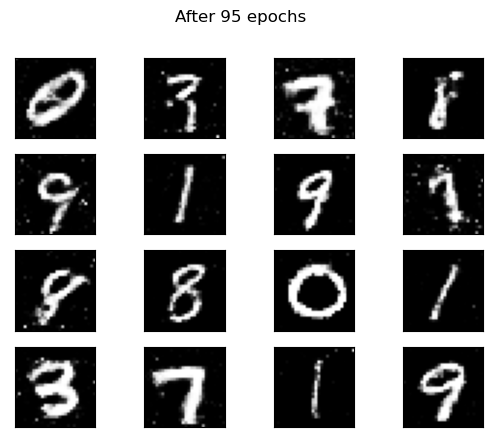

Epoch: 96 Loss D.: 0.6259984970092773
Epoch: 96 Loss G.: 1.147859811782837


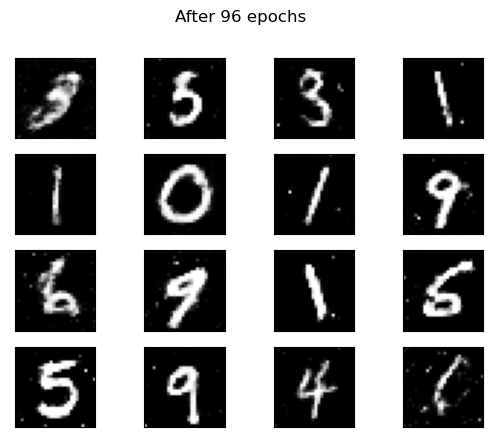

Epoch: 97 Loss D.: 0.4932093322277069
Epoch: 97 Loss G.: 0.941996157169342


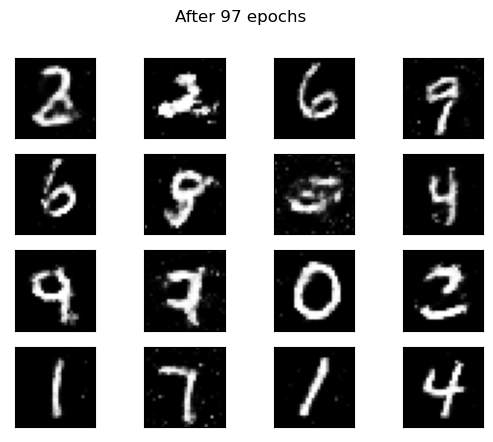

Epoch: 98 Loss D.: 0.6714964509010315
Epoch: 98 Loss G.: 0.8852463960647583


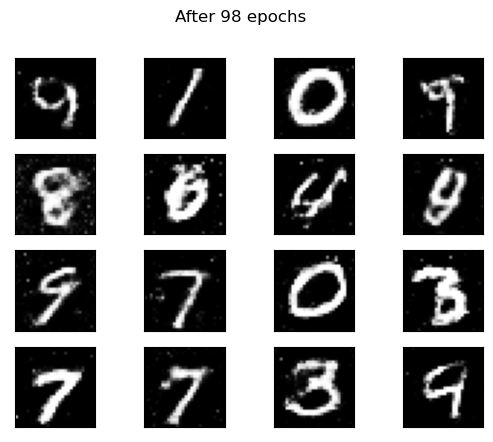

Epoch: 99 Loss D.: 0.4853794276714325
Epoch: 99 Loss G.: 1.0995173454284668


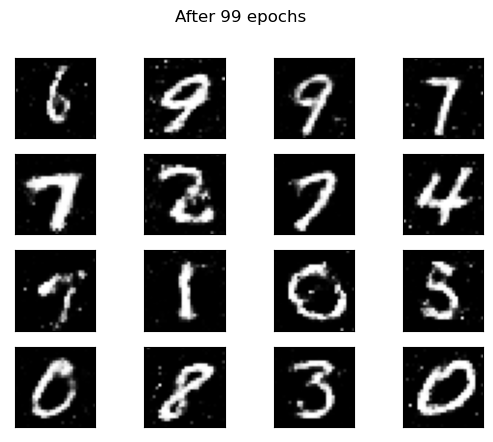

Epoch: 100 Loss D.: 0.4563305377960205
Epoch: 100 Loss G.: 0.9227551221847534


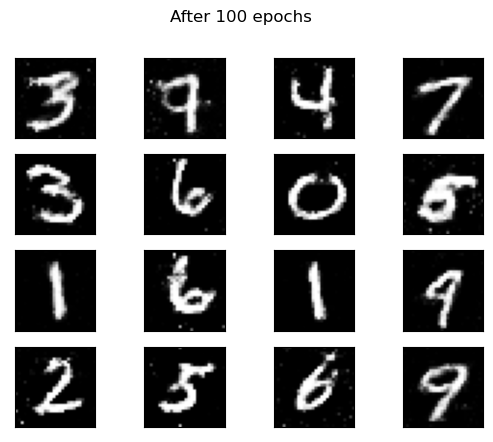

In [31]:
for epoch in range(epochs_num):
    for n, (samples, mnist_labels) in enumerate(train_ld):
        samples = samples.to(device=device)
        samples_labels = torch.ones((batch_s,1)).to(device = device)
        lt_space_samples = torch.randn((batch_s,100)).to(device=device)
        gen_samples = gen(lt_space_samples)
        gen_samples_labels = torch.zeros((batch_s,1)).to(device=device)
        all_samples = torch.cat((samples,gen_samples))
        all_samples_labels = torch.cat((samples_labels,gen_samples_labels))
        
        discrim.zero_grad()
        output_discrim = discrim(all_samples)
        loss_discrim = loss_func(output_discrim, all_samples_labels)
        loss_discrim.backward()
        optimize_discrim.step()
        
        lt_space_samples = torch.randn((batch_s,100)).to(device=device)
        
        gen.zero_grad()
        gen_samples = gen(lt_space_samples)
        output_discrim_gen = discrim(gen_samples)
        loss_gen = loss_func(output_discrim_gen, samples_labels)
        loss_gen.backward()
        optimize_gen.step()
        
        if n==batch_s -1:
            print(f"Epoch: {epoch+1} Loss D.: {loss_discrim}")
            print(f"Epoch: {epoch+1} Loss G.: {loss_gen}")
            
    #Creating images for each epoch of training to show how well the images created by the generator appear.
    lt_space_samples = torch.randn(batch_s,100).to(device=device)
    gen_samples = gen(lt_space_samples)
    gen_samples = gen_samples.cpu().detach() #Detatching the the generated samples is necessary to return a tensor from the computational graph to allow for computation of the gradients.
    fls = []
    imgs = []
    fig = plt.figure()
    filename = 'gen_fig_e%03d.png' % (epoch+1)
    for i in range(16):
        axis = fig.add_subplot(4,4,i+1)
        plt.imshow(gen_samples[i].reshape(28,28),cmap="gray")
        plt.xticks([])
        plt.yticks([])
    fig.suptitle(f"After {epoch+1} epochs")
    fig.savefig(filename,transparent = False, facecolor = 'white')
    plt.show()
    
    # Generate and save sample images
    
    if (epoch + 1) % 5 == 0:
        gen_samples = gen_samples.view(gen_samples.size(0), 1, 28, 28)
        vutils.save_image(gen_samples.data, f"./Samples/MNIST_GAN_samples_epoch_{epoch+1}.png", normalize=True)

In [ ]:
#save trained models

torch.save(gen.state_dict(), "MNIST_GAN_generator.pth")
torch.save(discrim.state_dict(), "MNIST_GAN_discriminator.pth")